# Food-11 Image Classification

This notebook implements a complete image classification pipeline on the Food-11 dataset. The work is divided into two parts.
 Part A covers custom CNN architectures, including a baseline model, a deeper regularized network, an optimizer comparison between Adam and SGD, and an ablation study on dropout and batch normalization. 
Part B covers transfer learning using MobileNetV2, including feature extraction with a frozen base and fine-tuning of the top layers.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

zip_path = '/content/drive/MyDrive/archive.zip'
extract_path = '/content/food11'

if not os.path.exists(extract_path):
    os.makedirs(extract_path)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("extracted!")
else:
    print("already extracted")

# quick look at folder structure
for root, dirs, files in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    if level < 2:
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/ ({len(files)} files)')

extracted!
food11/ (0 files)
  validation/ (0 files)
  training/ (0 files)
  evaluation/ (0 files)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random
import time

sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 100
random.seed(42)

## 1. Exploratory Data Analysis

In [ ]:
BASE_PATH = '/content/food11'
TRAIN_DIR = os.path.join(BASE_PATH, 'training')
VAL_DIR = os.path.join(BASE_PATH, 'validation')
EVAL_DIR = os.path.join(BASE_PATH, 'evaluation')

# checking if all directories exist and listing classes
for d, name in [(TRAIN_DIR, 'Training'), (VAL_DIR, 'Validation'), (EVAL_DIR, 'Evaluation')]:
    if os.path.exists(d):
        classes = sorted([c for c in os.listdir(d) if os.path.isdir(os.path.join(d, c))])
        print(f"{name}: {len(classes)} classes -> {classes}")
    else:
        print(f"{name}: NOT FOUND")

Training: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Validation: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Evaluation: 11 classes -> ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']


In [ ]:
def build_dataframe(directory, split_name):
    data = []
    if not os.path.exists(directory):
        return pd.DataFrame(data)
    for class_name in sorted(os.listdir(directory)):
        class_dir = os.path.join(directory, class_name)
        if not os.path.isdir(class_dir):
            continue
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                data.append({
                    'image_path': os.path.join(class_dir, img_name),
                    'class_name': class_name,
                    'split': split_name,
                    'filename': img_name
                })
    return pd.DataFrame(data)

train_df = build_dataframe(TRAIN_DIR, 'Training')
val_df = build_dataframe(VAL_DIR, 'Validation')
eval_df = build_dataframe(EVAL_DIR, 'Evaluation')
all_df = pd.concat([train_df, val_df, eval_df], ignore_index=True)

print(f"training:   {len(train_df)}")
print(f"validation: {len(val_df)}")
print(f"evaluation: {len(eval_df)}")
print(f"total:      {len(all_df)}")

training:   9866
validation: 3430
evaluation: 3347
total:      16643


In [ ]:
# class distribution across splits
dist_table = all_df.groupby(['class_name', 'split']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in dist_table.columns:
        dist_table[col] = 0
dist_table['Total'] = dist_table[['Training', 'Validation', 'Evaluation']].sum(axis=1)
dist_table = dist_table[['Training', 'Validation', 'Evaluation', 'Total']]
dist_table = dist_table.sort_values('Total', ascending=False)
print(dist_table)
print(f"\nlargest class:  {dist_table.index[0]} ({dist_table['Total'].iloc[0]})")
print(f"smallest class: {dist_table.index[-1]} ({dist_table['Total'].iloc[-1]})")
print(f"imbalance ratio: {dist_table['Total'].iloc[0] / dist_table['Total'].iloc[-1]:.1f}x")

split            Training  Validation  Evaluation  Total
class_name                                              
Dessert              1500         500         500   2500
Soup                 1500         500         500   2500
Meat                 1325         449         432   2206
Bread                 994         362         368   1724
Egg                   986         327         335   1648
Seafood               855         347         303   1505
Fried food            848         326         287   1461
Vegetable-Fruit       709         232         231   1172
Noodles-Pasta         440         147         147    734
Dairy product         429         144         148    721
Rice                  280          96          96    472

largest class:  Dessert (2500)
smallest class: Rice (472)
imbalance ratio: 5.3x


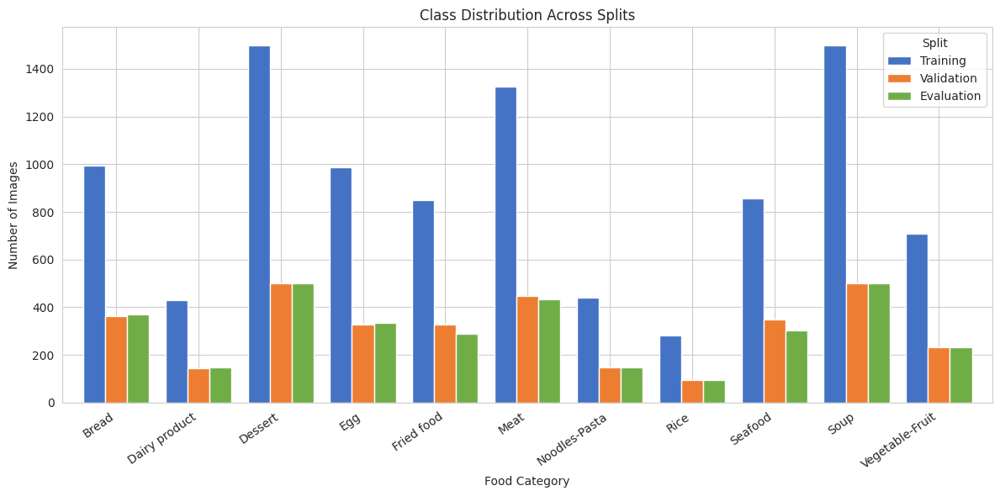

In [ ]:
# bar chart showing distribution per split
fig, ax = plt.subplots(figsize=(12, 6))
dist_for_plot = all_df.groupby(['class_name', 'split']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in dist_for_plot.columns:
        dist_for_plot[col] = 0
dist_for_plot = dist_for_plot[['Training', 'Validation', 'Evaluation']]
dist_for_plot.plot(kind='bar', ax=ax, color=['#4472C4', '#ED7D31', '#70AD47'], width=0.8)
ax.set_title('Class Distribution Across Splits')
ax.set_xlabel('Food Category')
ax.set_ylabel('Number of Images')
ax.legend(title='Split')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

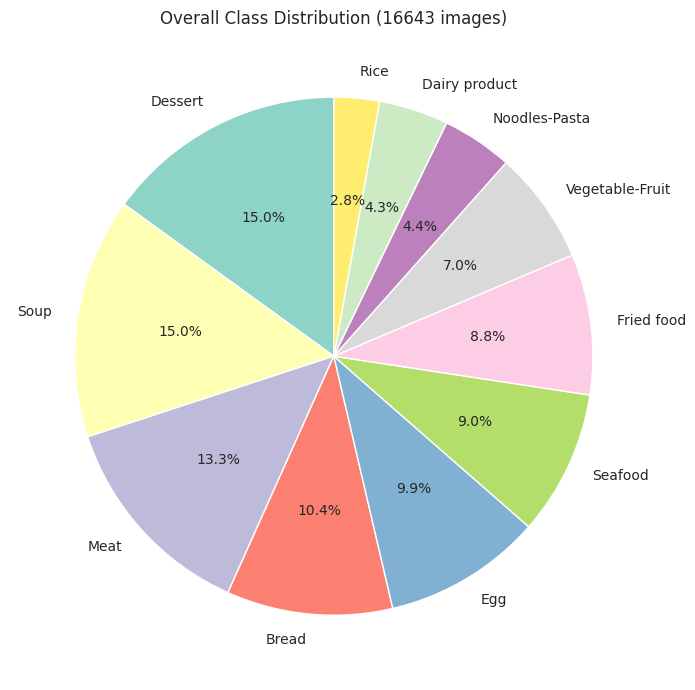

In [ ]:
# pie chart for overall distribution
class_totals = all_df['class_name'].value_counts()
fig, ax = plt.subplots(figsize=(9, 7))
colors = plt.cm.Set3(np.linspace(0, 1, len(class_totals)))
ax.pie(class_totals.values, labels=class_totals.index, autopct='%1.1f%%',
       colors=colors, startangle=90, textprops={'fontsize': 10})
ax.set_title(f'Overall Class Distribution ({len(all_df)} images)')
plt.tight_layout()
plt.show()

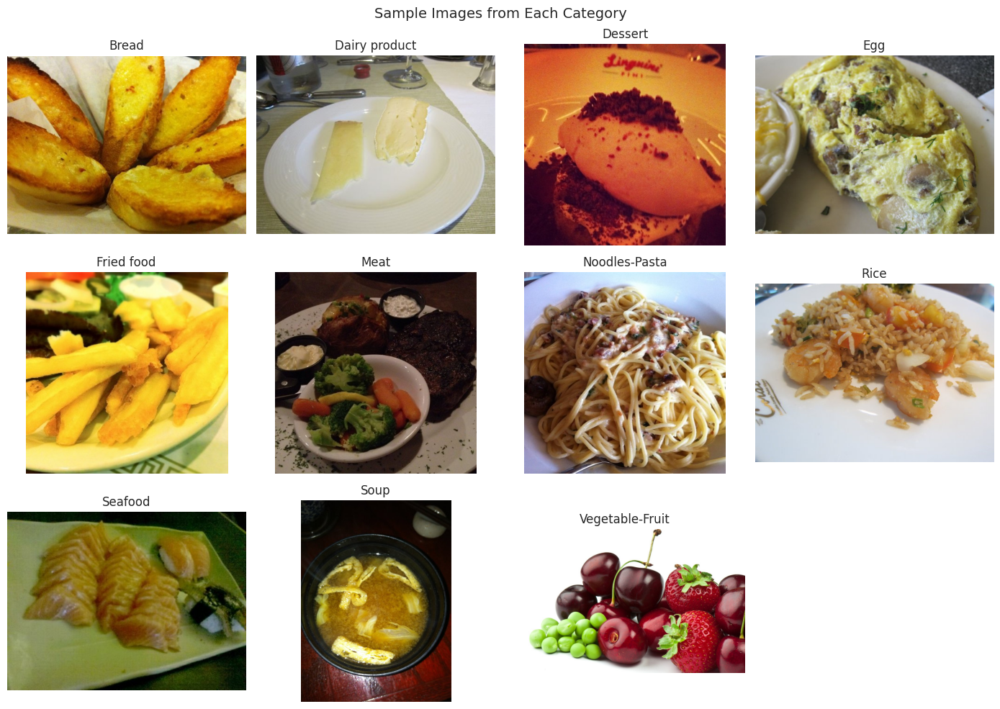

In [ ]:
# one sample image from each class
classes = sorted(all_df['class_name'].unique())
n_classes = len(classes)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes = axes.flatten()
for idx, class_name in enumerate(classes):
    class_images = train_df[train_df['class_name'] == class_name]['image_path'].tolist()
    if class_images:
        img = Image.open(random.choice(class_images))
        axes[idx].imshow(img)
        axes[idx].set_title(class_name)
        axes[idx].axis('off')
for idx in range(n_classes, len(axes)):
    axes[idx].axis('off')
plt.suptitle('Sample Images from Each Category', fontsize=14)
plt.tight_layout()
plt.show()

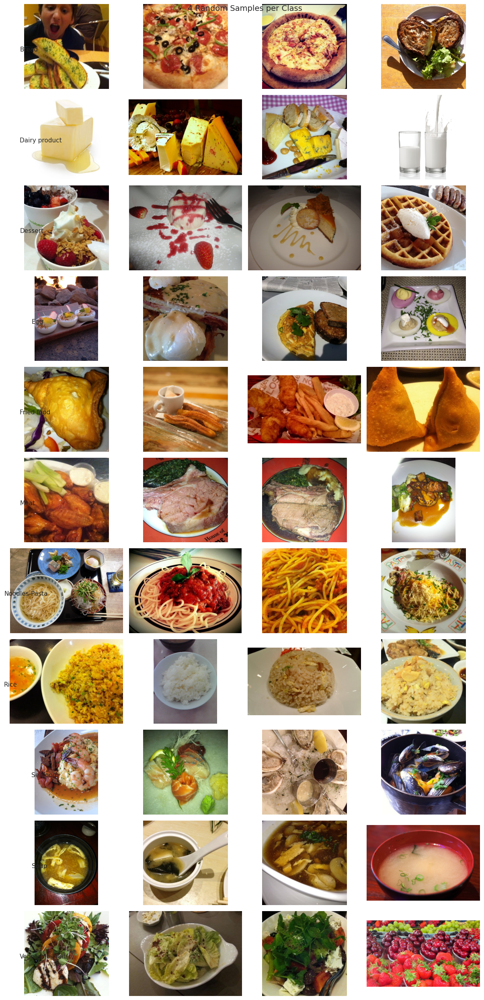

In [ ]:
# 4 random samples per class
fig, axes = plt.subplots(n_classes, 4, figsize=(12, 2.3 * n_classes))
for i, class_name in enumerate(classes):
    class_images = train_df[train_df['class_name'] == class_name]['image_path'].tolist()
    samples = random.sample(class_images, min(4, len(class_images)))
    for j in range(4):
        if j < len(samples):
            img = Image.open(samples[j])
            axes[i, j].imshow(img)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_title(class_name, fontsize=11, loc='left', x=-0.05, y=0.4)
plt.suptitle('4 Random Samples per Class', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# checking image dimensions
sample_df = train_df.sample(n=min(500, len(train_df)), random_state=42)
widths, heights, aspect_ratios = [], [], []
for path in sample_df['image_path']:
    try:
        img = Image.open(path)
        w, h = img.size
        widths.append(w)
        heights.append(h)
        aspect_ratios.append(w / h)
    except:
        continue

print(f"width  - min: {min(widths)}, max: {max(widths)}, avg: {np.mean(widths):.0f}")
print(f"height - min: {min(heights)}, max: {max(heights)}, avg: {np.mean(heights):.0f}")
print(f"aspect ratio - avg: {np.mean(aspect_ratios):.2f}")

width  - min: 280, max: 2118, avg: 514
height - min: 287, max: 1418, avg: 479
aspect ratio - avg: 1.10


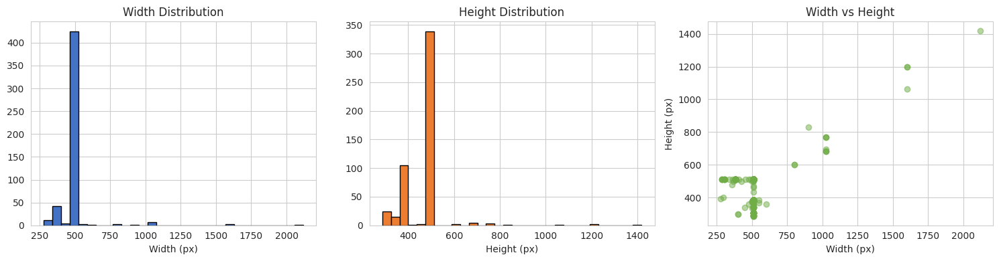

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(widths, bins=30, color='#4472C4', edgecolor='black')
axes[0].set_title('Width Distribution')
axes[0].set_xlabel('Width (px)')
axes[1].hist(heights, bins=30, color='#ED7D31', edgecolor='black')
axes[1].set_title('Height Distribution')
axes[1].set_xlabel('Height (px)')
axes[2].scatter(widths, heights, alpha=0.5, color='#70AD47')
axes[2].set_title('Width vs Height')
axes[2].set_xlabel('Width (px)')
axes[2].set_ylabel('Height (px)')
plt.tight_layout()
plt.show()

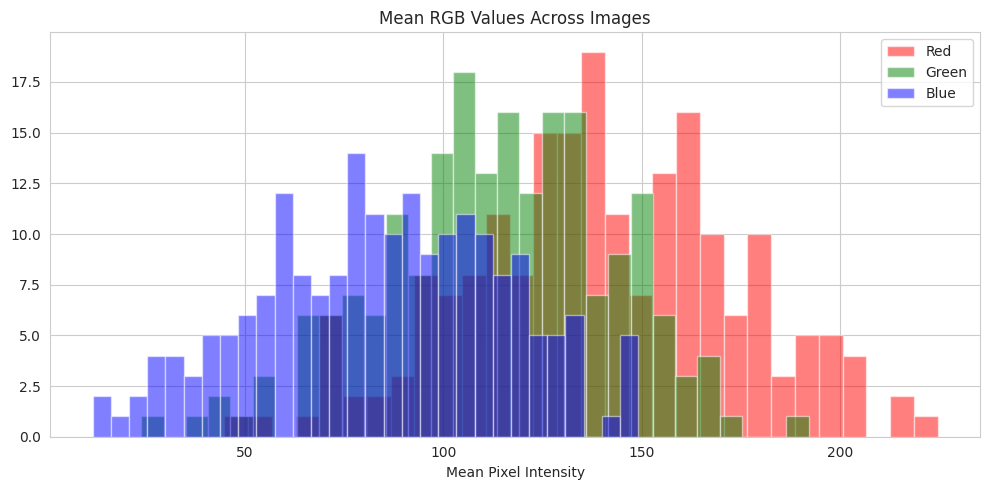

avg R: 139.6, G: 113.4, B: 84.6


In [ ]:
# mean RGB values across a sample of images
sample_color = train_df.sample(n=min(200, len(train_df)), random_state=42)
r_means, g_means, b_means = [], [], []
for path in sample_color['image_path']:
    try:
        img = np.array(Image.open(path).convert('RGB'))
        r_means.append(img[:,:,0].mean())
        g_means.append(img[:,:,1].mean())
        b_means.append(img[:,:,2].mean())
    except:
        continue

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(r_means, bins=30, alpha=0.5, color='red', label='Red')
ax.hist(g_means, bins=30, alpha=0.5, color='green', label='Green')
ax.hist(b_means, bins=30, alpha=0.5, color='blue', label='Blue')
ax.set_title('Mean RGB Values Across Images')
ax.set_xlabel('Mean Pixel Intensity')
ax.legend()
plt.tight_layout()
plt.show()
print(f"avg R: {np.mean(r_means):.1f}, G: {np.mean(g_means):.1f}, B: {np.mean(b_means):.1f}")

In [ ]:
print("EDA Summary")
print(f"total images: {len(all_df)}")
print(f"classes: {all_df['class_name'].nunique()}")
print(f"train/val/eval: {len(train_df)}/{len(val_df)}/{len(eval_df)}")
print(f"imbalance: {class_totals.max()}/{class_totals.min()} = {class_totals.max()/class_totals.min():.1f}x")
print(f"images have different sizes so we need to resize them")

EDA Summary
total images: 16643
classes: 11
train/val/eval: 9866/3430/3347
imbalance: 2500/472 = 5.3x
images have different sizes so we need to resize them


## 2. Data Preprocessing and Augmentation

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("tensorflow:", tf.__version__)
print("gpu:", tf.config.list_physical_devices('GPU'))

tensorflow: 2.20.0
gpu: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
IMG_SIZE = (128, 128)
BATCH_SIZE = 64
NUM_CLASSES = 11

# training data gets augmented, val and eval dont
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)
eval_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=True, seed=42
)
val_generator = val_datagen.flow_from_directory(
    VAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)
eval_generator = eval_datagen.flow_from_directory(
    EVAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [ ]:
class_indices = train_generator.class_indices
class_names = list(class_indices.keys())
print("classes:", class_names)
print(f"train: {train_generator.samples}, val: {val_generator.samples}, eval: {eval_generator.samples}")

classes: ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
train: 9866, val: 3430, eval: 3347


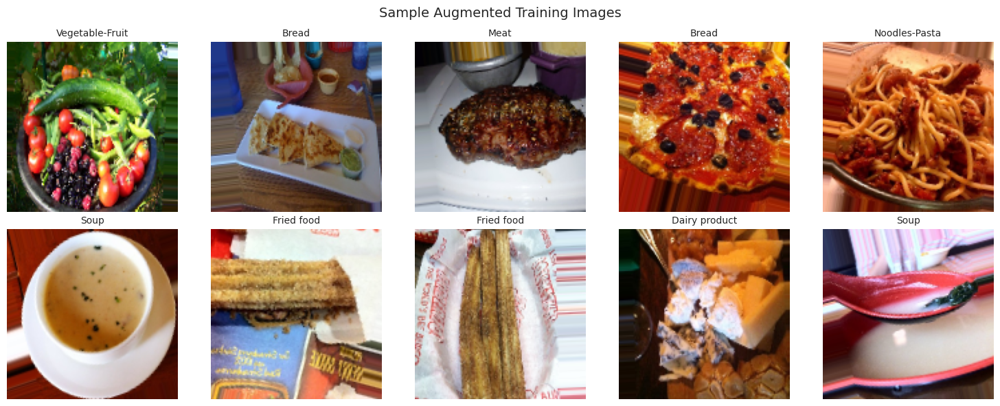

In [ ]:
# showing some augmented training images
batch_x, batch_y = next(train_generator)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(batch_x[i])
    ax.set_title(class_names[np.argmax(batch_y[i])], fontsize=10)
    ax.axis('off')
plt.suptitle('Sample Augmented Training Images', fontsize=14)
plt.tight_layout()
plt.show()

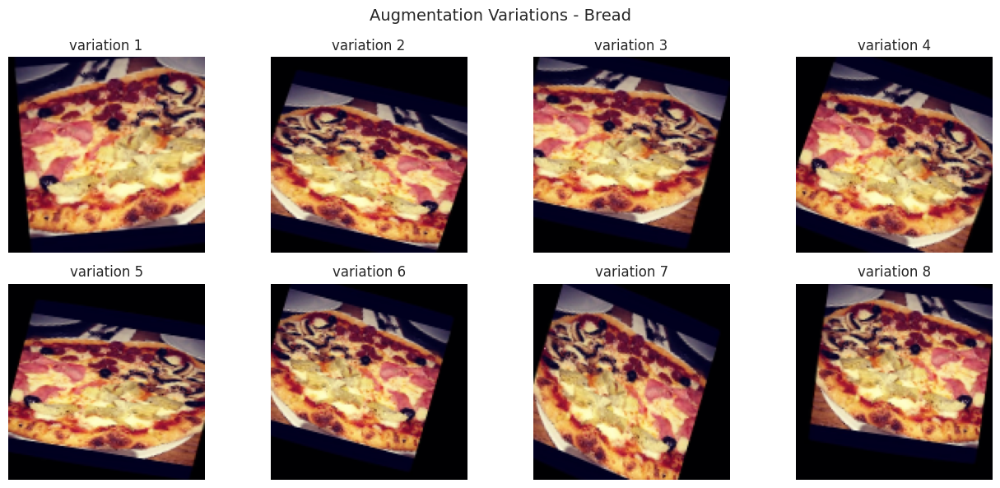

In [ ]:
# showing how augmentation changes a single image
from tensorflow.keras.preprocessing import image

sample_class = class_names[0]
sample_dir = os.path.join(TRAIN_DIR, sample_class)
sample_file = os.path.join(sample_dir, os.listdir(sample_dir)[0])

img = image.load_img(sample_file, target_size=IMG_SIZE)
x = image.img_to_array(img).reshape((1,) + image.img_to_array(img).shape)

fig, axes = plt.subplots(2, 4, figsize=(13, 6))
i = 0
for batch in train_datagen.flow(x, batch_size=1, seed=42):
    axes.flatten()[i].imshow(batch[0])
    axes.flatten()[i].set_title(f'variation {i+1}')
    axes.flatten()[i].axis('off')
    i += 1
    if i >= 8: break
plt.suptitle(f'Augmentation Variations - {sample_class}', fontsize=14)
plt.tight_layout()
plt.show()

## 3. Part A: Baseline CNN Model

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input

def build_baseline_cnn(input_shape=(128, 128, 3), num_classes=11):
    model = Sequential(name="Baseline_CNN")
    model.add(Input(shape=input_shape))

    # Block 1
    model.add(Conv2D(32, (3,3), activation="relu", padding="same"))
    model.add(MaxPooling2D((2,2)))

    # Block 2
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(MaxPooling2D((2,2)))

    # Block 3
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(MaxPooling2D((2,2)))

    model.add(Flatten())
    model.add(Dense(256, activation="relu"))
    model.add(Dense(num_classes, activation="softmax"))
    return model

baseline_model = build_baseline_cnn()
baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,484,939 (32.37 MB)

 Trainable params: 8,484,939 (32.37 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.layers import Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

baseline_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)
print(f"params: {baseline_model.count_params():,}")


params: 8,484,939


In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weight_dict = dict(enumerate(class_weights))
print("class weights:", class_weight_dict)

class weights: {0: np.float64(0.9023230290835924), 1: np.float64(2.0906971816062727), 2: np.float64(0.597939393939394), 3: np.float64(0.9096441084270699), 4: np.float64(1.0576758147512864), 5: np.float64(0.6769125214408234), 6: np.float64(2.038429752066116), 7: np.float64(3.2032467532467535), 8: np.float64(1.049016480595428), 9: np.float64(0.597939393939394), 10: np.float64(1.2650339787152198)}


In [ ]:
def get_callbacks():
    return [
        EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1)
    ]

start_time = time.time()
baseline_history = baseline_model.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
baseline_time = time.time() - start_time
print(f"done in {baseline_time:.1f}s ({baseline_time/60:.1f} min)")


Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 92s 545ms/step - accuracy: 0.1779 - loss: 2.2321 - val_accuracy: 0.2315 - val_loss: 2.1232 - learning_rate: 0.0010
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 76s 492ms/step - accuracy: 0.2788 - loss: 1.9787 - val_accuracy: 0.2878 - val_loss: 2.0132 - learning_rate: 0.0010
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 80s 514ms/step - accuracy: 0.3259 - loss: 1.8428 - val_accuracy: 0.3534 - val_loss: 1.8626 - learning_rate: 0.0010
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 76s 493ms/step - accuracy: 0.3649 - loss: 1.7338 - val_accuracy: 0.3443 - val_loss: 1.8924 - learning_rate: 0.0010
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 76s 494ms/step - accuracy: 0.3956 - loss: 1.6626 - val_accuracy: 0.3805 - val_loss: 1.8007 - learning_rate: 0.0010
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 76s 488ms/step - accuracy: 0.4350 - loss: 1.5676 - val_accuracy: 0.3434 - val_loss: 1.9195 - learning_rate: 0.0010
Epoch 7/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 75s 482ms/step - accuracy: 0.4

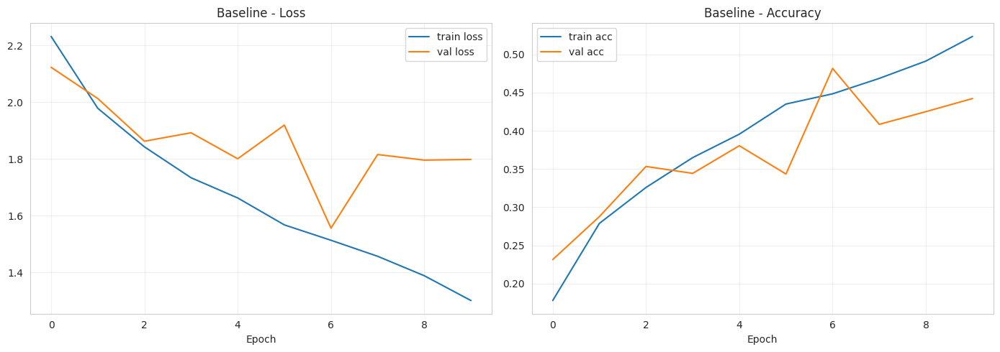

In [ ]:
# loss and accuracy curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(baseline_history.history['loss'], label='train loss')
axes[0].plot(baseline_history.history['val_loss'], label='val loss')
axes[0].set_title('Baseline - Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(baseline_history.history['accuracy'], label='train acc')
axes[1].plot(baseline_history.history['val_accuracy'], label='val acc')
axes[1].set_title('Baseline - Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# evaluating on test set
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

baseline_loss, baseline_acc = baseline_model.evaluate(eval_generator, verbose=1)

eval_generator.reset()
y_pred = np.argmax(baseline_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f"\naccuracy:  {acc*100:.2f}%")
print(f"precision: {precision*100:.2f}%")
print(f"recall:    {recall*100:.2f}%")
print(f"f1 score:  {f1*100:.2f}%")
print()
print(classification_report(y_true, y_pred, target_names=class_names))

53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 218ms/step - accuracy: 0.4915 - loss: 1.5027
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step

accuracy:  49.15%
precision: 51.89%
recall:    49.15%
f1 score:  48.43%

                 precision    recall  f1-score   support

          Bread       0.36      0.26      0.30       368
  Dairy product       0.26      0.34      0.29       148
        Dessert       0.57      0.31      0.40       500
            Egg       0.50      0.30      0.37       335
     Fried food       0.41      0.48      0.44       287
           Meat       0.50      0.72      0.59       432
  Noodles-Pasta       0.28      0.77      0.41       147
           Rice       0.34      0.34      0.34        96
        Seafood       0.60      0.52      0.55       303
           Soup       0.75      0.56      0.64       500
Vegetable-Fruit       0.67      0.91      0.77       231

       accuracy                           0.49      3347
      macro avg       0.48      0.50      0.47      3347
   weigh

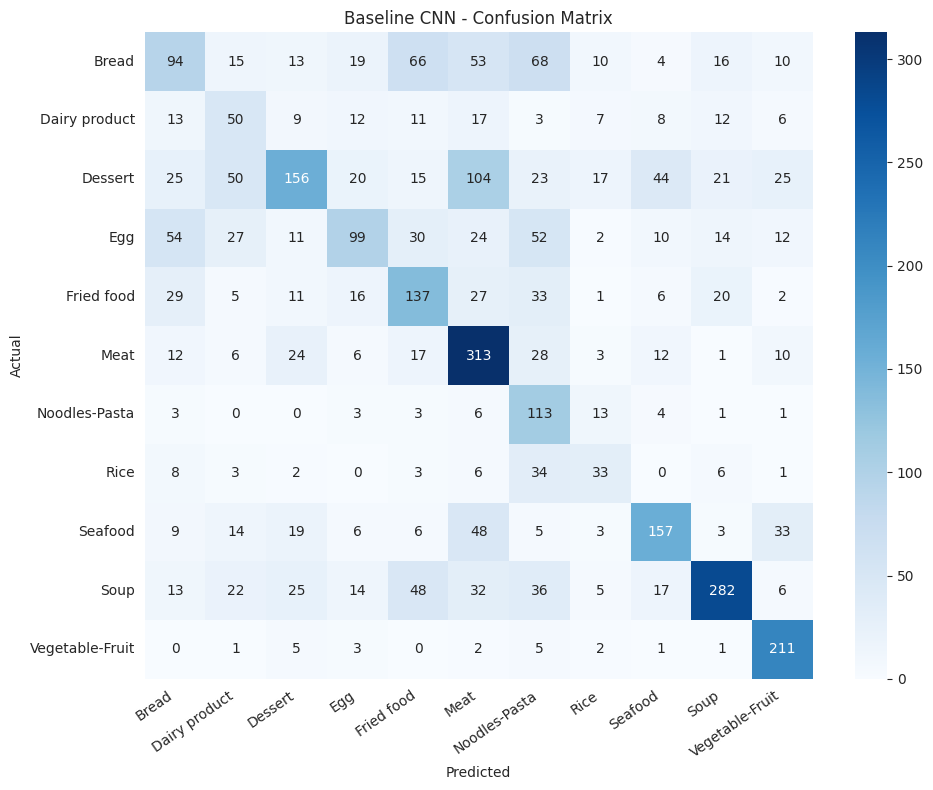

In [ ]:
# confusion matrix
cm = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('Baseline CNN - Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

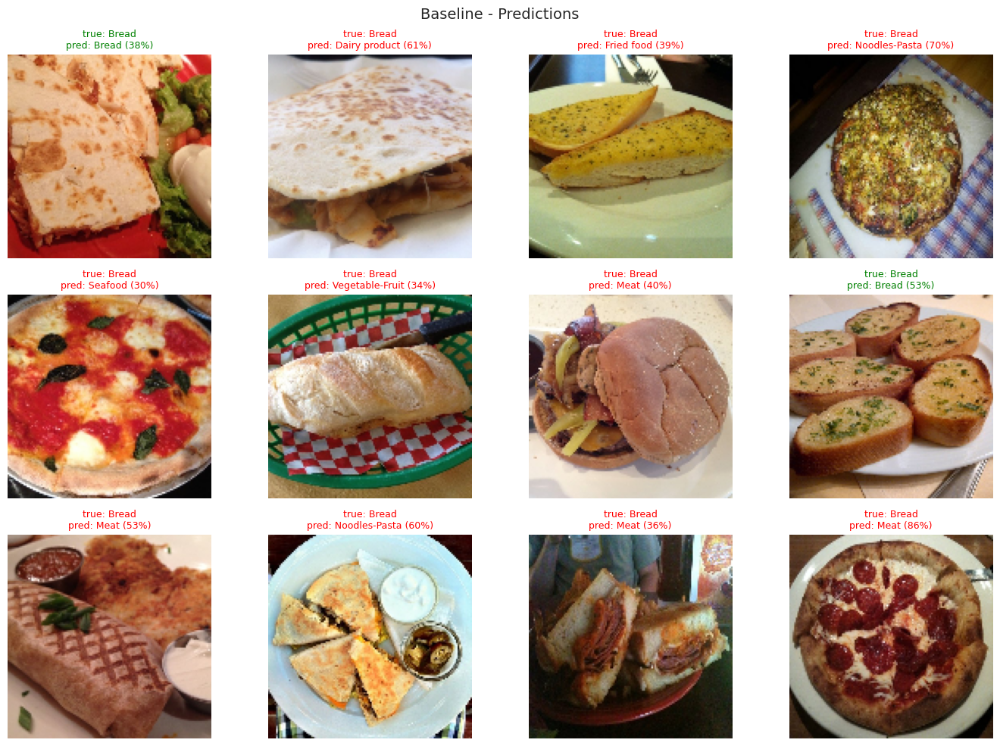

In [ ]:
# sample predictions
eval_generator.reset()
sx, sy = next(eval_generator)
sp = baseline_model.predict(sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf = np.max(sp[i]) * 100
        color = 'green' if true_c == pred_c else 'red'
        ax.set_title(f'true: {true_c}\npred: {pred_c} ({conf:.0f}%)', fontsize=9, color=color)
        ax.axis('off')
plt.suptitle('Baseline - Predictions', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# saving baseline results for later comparison
baseline_results = {
    'accuracy': acc, 'precision': precision, 'recall': recall,
    'f1_score': f1, 'eval_loss': baseline_loss,
    'training_time_sec': baseline_time,
    'epochs_trained': len(baseline_history.history['loss']),
    'total_params': baseline_model.count_params(),
    'history': baseline_history.history
}
baseline_model.save('/content/baseline_cnn.keras')
print("baseline saved")

baseline saved


## 4. Deeper CNN with Regularization

In [ ]:
from tensorflow.keras.layers import Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


In [ ]:
def build_deeper_cnn(input_shape=(128, 128, 3), num_classes=11):
    model = Sequential(name="Deeper_CNN")
    model.add(Input(shape=input_shape))

    # Block 1 - two conv layers
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.25))

    # Block 2
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.3))

    # Block 3
    model.add(Conv2D(256, (3,3), activation="relu", padding="same"))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))
    model.add(Dropout(0.3))

    # GlobalAveragePooling is much faster than Flatten for deep nets
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation="relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation="softmax"))
    return model

deeper_model = build_deeper_cnn()
deeper_model.summary()


Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 627,531 (2.39 MB)

 Trainable params: 625,739 (2.39 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [ ]:
# quick comparison of model sizes
print(f"baseline params: {baseline_model.count_params():,}")
print(f"deeper params:   {deeper_model.count_params():,}")

baseline params: 8,484,939
deeper params:   627,531


In [ ]:
deeper_model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

start_time = time.time()
deeper_history = deeper_model.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
deeper_time = time.time() - start_time
print(f"done in {deeper_time:.1f}s ({deeper_time/60:.1f} min)")


Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 136s 683ms/step - accuracy: 0.2067 - loss: 2.6422 - val_accuracy: 0.1501 - val_loss: 3.4900 - learning_rate: 5.0000e-04
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 82s 526ms/step - accuracy: 0.2717 - loss: 2.2737 - val_accuracy: 0.1481 - val_loss: 6.4255 - learning_rate: 5.0000e-04
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.2928 - loss: 2.1235
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
155/155 ━━━━━━━━━━━━━━━━━━━━ 83s 532ms/step - accuracy: 0.3037 - loss: 2.1009 - val_accuracy: 0.1539 - val_loss: 4.4462 - learning_rate: 5.0000e-04
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 84s 540ms/step - accuracy: 0.3555 - loss: 1.9057 - val_accuracy: 0.2965 - val_loss: 2.1121 - learning_rate: 2.5000e-04
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 85s 550ms/step - accuracy: 0.3737 - loss: 1.8076 - val_accuracy: 0.3431 - val_loss: 1.9734 - learning_rate: 2.5000e-04
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 86s 551ms/s

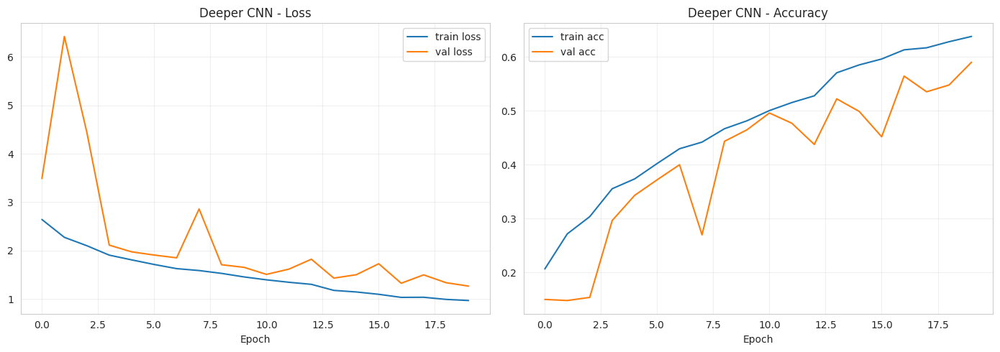

In [ ]:
# deeper model curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_history.history['loss'], label='train loss')
axes[0].plot(deeper_history.history['val_loss'], label='val loss')
axes[0].set_title('Deeper CNN - Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_history.history['accuracy'], label='train acc')
axes[1].plot(deeper_history.history['val_accuracy'], label='val acc')
axes[1].set_title('Deeper CNN - Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

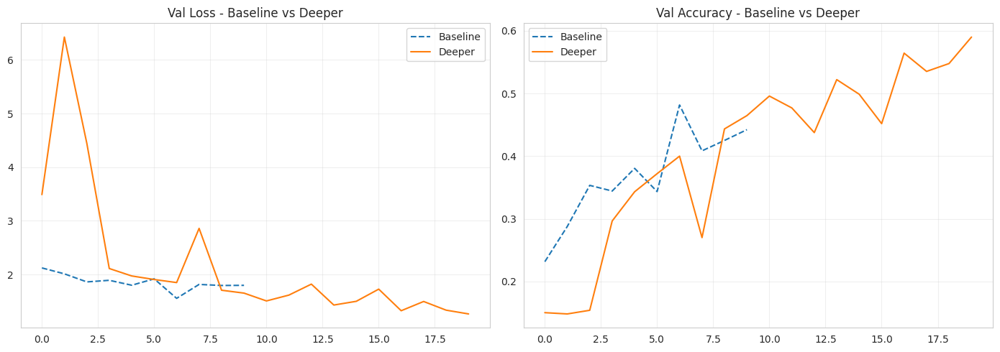

In [ ]:
# comparing baseline vs deeper validation curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(baseline_results['history']['val_loss'], label='Baseline', linestyle='--')
axes[0].plot(deeper_history.history['val_loss'], label='Deeper')
axes[0].set_title('Val Loss - Baseline vs Deeper')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(baseline_results['history']['val_accuracy'], label='Baseline', linestyle='--')
axes[1].plot(deeper_history.history['val_accuracy'], label='Deeper')
axes[1].set_title('Val Accuracy - Baseline vs Deeper')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# deeper model evaluation
deeper_loss, deeper_acc_raw = deeper_model.evaluate(eval_generator, verbose=1)

eval_generator.reset()
y_pred_deep = np.argmax(deeper_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_deep = accuracy_score(y_true, y_pred_deep)
prec_deep = precision_score(y_true, y_pred_deep, average='weighted')
rec_deep = recall_score(y_true, y_pred_deep, average='weighted')
f1_deep = f1_score(y_true, y_pred_deep, average='weighted')

print(f"\naccuracy:  {acc_deep*100:.2f}%")
print(f"precision: {prec_deep*100:.2f}%")
print(f"recall:    {rec_deep*100:.2f}%")
print(f"f1 score:  {f1_deep*100:.2f}%")
print()
print(classification_report(y_true, y_pred_deep, target_names=class_names))

53/53 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - accuracy: 0.6110 - loss: 1.1444
53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step

accuracy:  61.10%
precision: 68.54%
recall:    61.10%
f1 score:  61.80%

                 precision    recall  f1-score   support

          Bread       0.46      0.71      0.56       368
  Dairy product       0.25      0.75      0.38       148
        Dessert       0.61      0.39      0.48       500
            Egg       0.66      0.39      0.49       335
     Fried food       0.76      0.56      0.64       287
           Meat       0.75      0.73      0.74       432
  Noodles-Pasta       0.90      0.62      0.73       147
           Rice       0.41      0.91      0.56        96
        Seafood       0.85      0.46      0.59       303
           Soup       0.87      0.67      0.75       500
Vegetable-Fruit       0.67      0.97      0.79       231

       accuracy                           0.61      3347
      macro avg       0.65      0.65      0.61      3347
   weigh

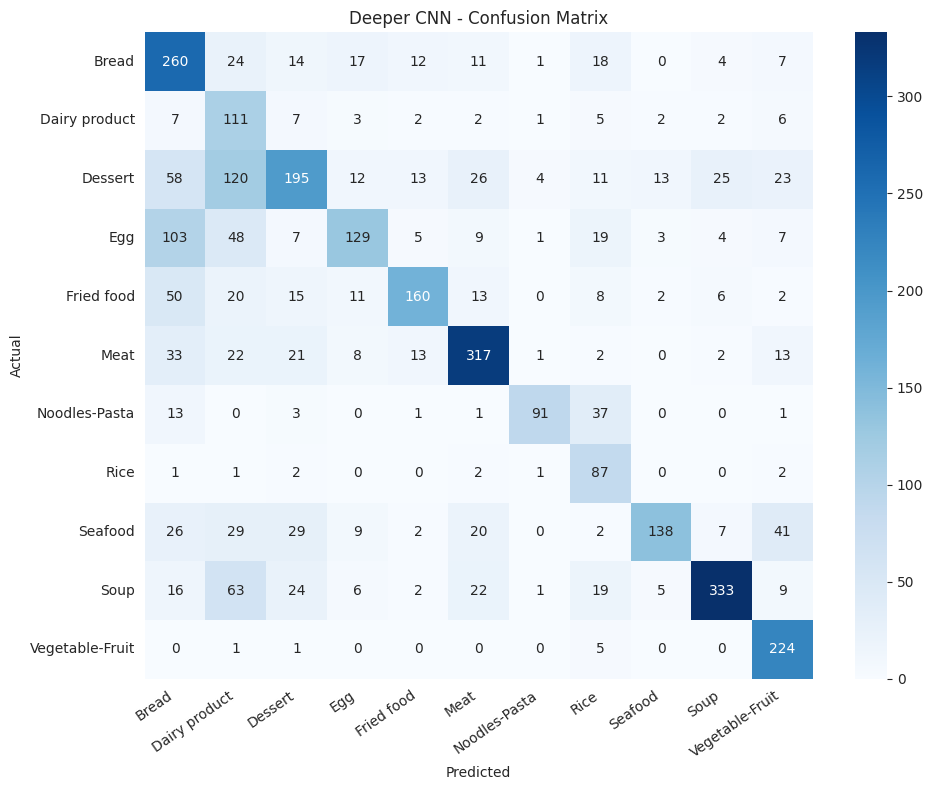

In [ ]:
# confusion matrix for deeper model
cm_deep = confusion_matrix(y_true, y_pred_deep)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_deep, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('Deeper CNN - Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

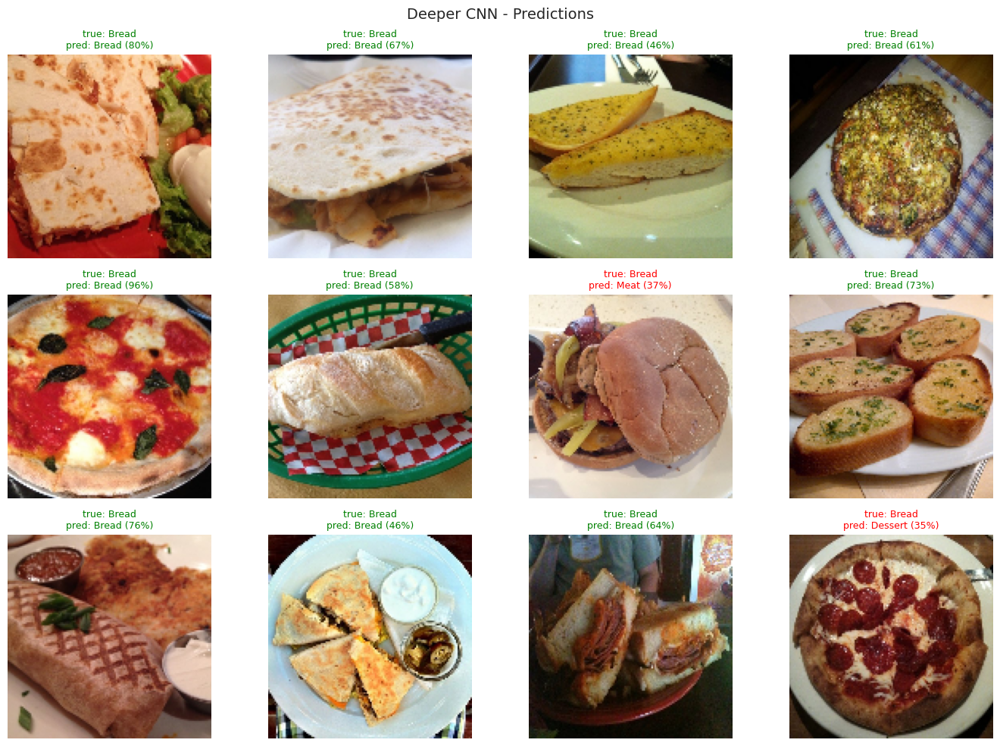

In [ ]:
# sample predictions - deeper model
eval_generator.reset()
sx, sy = next(eval_generator)
sp = deeper_model.predict(sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf = np.max(sp[i]) * 100
        color = 'green' if true_c == pred_c else 'red'
        ax.set_title(f'true: {true_c}\npred: {pred_c} ({conf:.0f}%)', fontsize=9, color=color)
        ax.axis('off')
plt.suptitle('Deeper CNN - Predictions', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
deeper_results = {
    'accuracy': acc_deep, 'precision': prec_deep, 'recall': rec_deep,
    'f1_score': f1_deep, 'eval_loss': deeper_loss,
    'training_time_sec': deeper_time,
    'epochs_trained': len(deeper_history.history['loss']),
    'total_params': deeper_model.count_params(),
    'history': deeper_history.history
}

# quick comparison so far
print(f"{'':20s} {'Baseline':>10s} {'Deeper':>10s}")
print(f"{'accuracy':20s} {baseline_results['accuracy']*100:>9.2f}% {acc_deep*100:>9.2f}%")
print(f"{'f1 score':20s} {baseline_results['f1_score']*100:>9.2f}% {f1_deep*100:>9.2f}%")
print(f"{'training time':20s} {baseline_results['training_time_sec']:>9.1f}s {deeper_time:>9.1f}s")

deeper_model.save('/content/deeper_cnn.keras')

                       Baseline     Deeper
accuracy                 49.15%     61.10%
f1 score                 48.43%     61.80%
training time            778.4s    1762.8s


## 5. Experimentation
### 5.1 Optimizer Comparison: SGD vs Adam

In [ ]:
from tensorflow.keras.optimizers import SGD

deeper_sgd = build_deeper_cnn()
deeper_sgd.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

start_time = time.time()
sgd_history = deeper_sgd.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
sgd_time = time.time() - start_time
print(f"sgd training done in {sgd_time:.1f}s")


Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 103s 612ms/step - accuracy: 0.1757 - loss: 2.6315 - val_accuracy: 0.0997 - val_loss: 2.8305 - learning_rate: 0.0100
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 87s 558ms/step - accuracy: 0.2265 - loss: 2.2179 - val_accuracy: 0.1767 - val_loss: 2.3345 - learning_rate: 0.0100
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 86s 554ms/step - accuracy: 0.2601 - loss: 2.0769 - val_accuracy: 0.1980 - val_loss: 2.4736 - learning_rate: 0.0100
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 85s 549ms/step - accuracy: 0.3138 - loss: 1.9312 - val_accuracy: 0.2484 - val_loss: 2.3120 - learning_rate: 0.0100
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 85s 547ms/step - accuracy: 0.3295 - loss: 1.8863 - val_accuracy: 0.1729 - val_loss: 2.7612 - learning_rate: 0.0100
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.3478 - loss: 1.8227
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
155/155 ━━━━━━━━━━━━━━━━━━━━ 86s 550ms/step - accuracy: 0.353

In [ ]:
# sgd evaluation
eval_generator.reset()
sgd_loss, _ = deeper_sgd.evaluate(eval_generator, verbose=1)
eval_generator.reset()
y_pred_sgd = np.argmax(deeper_sgd.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_sgd = accuracy_score(y_true, y_pred_sgd)
prec_sgd = precision_score(y_true, y_pred_sgd, average='weighted')
rec_sgd = recall_score(y_true, y_pred_sgd, average='weighted')
f1_sgd = f1_score(y_true, y_pred_sgd, average='weighted')

print(f"sgd accuracy: {acc_sgd*100:.2f}%, f1: {f1_sgd*100:.2f}%")

53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 221ms/step - accuracy: 0.4201 - loss: 1.7073
53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step
sgd accuracy: 42.01%, f1: 40.77%


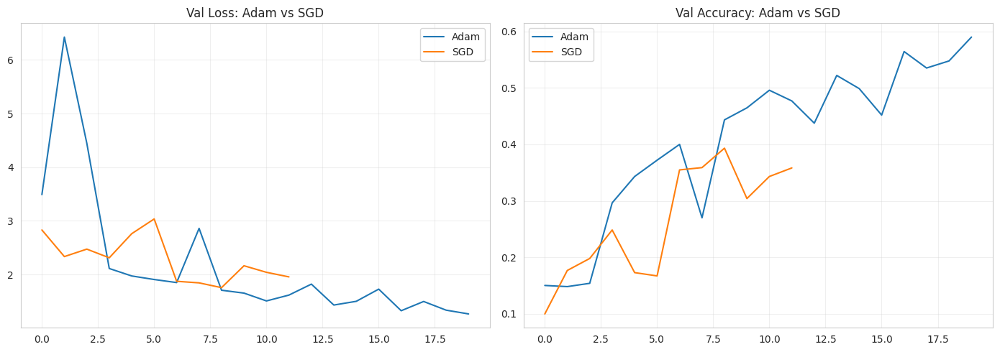


                      Adam        SGD
accuracy            61.10%     42.01%
f1 score            61.80%     40.77%
time               1762.8s    1099.5s


In [ ]:
# adam vs sgd curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_results['history']['val_loss'], label='Adam')
axes[0].plot(sgd_history.history['val_loss'], label='SGD')
axes[0].set_title('Val Loss: Adam vs SGD')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_results['history']['val_accuracy'], label='Adam')
axes[1].plot(sgd_history.history['val_accuracy'], label='SGD')
axes[1].set_title('Val Accuracy: Adam vs SGD')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

sgd_results = {
    'accuracy': acc_sgd, 'precision': prec_sgd, 'recall': rec_sgd,
    'f1_score': f1_sgd, 'eval_loss': sgd_loss,
    'training_time_sec': sgd_time,
    'epochs_trained': len(sgd_history.history['loss']),
    'history': sgd_history.history
}

print(f"\n{'':15s} {'Adam':>10s} {'SGD':>10s}")
print(f"{'accuracy':15s} {deeper_results['accuracy']*100:>9.2f}% {acc_sgd*100:>9.2f}%")
print(f"{'f1 score':15s} {deeper_results['f1_score']*100:>9.2f}% {f1_sgd*100:>9.2f}%")
print(f"{'time':15s} {deeper_results['training_time_sec']:>9.1f}s {sgd_time:>9.1f}s")

### 5.2 Ablation Study: Removing Dropout and Batch Normalization

In [ ]:
def build_no_dropout_no_bn(input_shape=(128, 128, 3), num_classes=11):
    model = Sequential(name="No_Dropout_No_BN")
    model.add(Input(shape=input_shape))

    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(Conv2D(64, (3,3), activation="relu", padding="same"))
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(Conv2D(128, (3,3), activation="relu", padding="same"))
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(256, (3,3), activation="relu", padding="same"))
    model.add(MaxPooling2D((2,2)))

    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation="relu"))
    model.add(Dense(num_classes, activation="softmax"))
    return model

ablation_model = build_no_dropout_no_bn()
ablation_model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

start_time = time.time()
ablation_history = ablation_model.fit(
    train_generator, epochs=20,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
abl_time = time.time() - start_time
print(f"ablation done in {abl_time:.1f}s")

Epoch 1/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 92s 558ms/step - accuracy: 0.1141 - loss: 2.3449 - val_accuracy: 0.1163 - val_loss: 2.3345 - learning_rate: 5.0000e-04
Epoch 2/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 82s 528ms/step - accuracy: 0.1925 - loss: 2.2106 - val_accuracy: 0.2327 - val_loss: 2.1716 - learning_rate: 5.0000e-04
Epoch 3/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 83s 530ms/step - accuracy: 0.2189 - loss: 2.1214 - val_accuracy: 0.2723 - val_loss: 2.0591 - learning_rate: 5.0000e-04
Epoch 4/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 82s 531ms/step - accuracy: 0.2549 - loss: 2.0663 - val_accuracy: 0.2466 - val_loss: 2.0755 - learning_rate: 5.0000e-04
Epoch 5/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 82s 531ms/step - accuracy: 0.2740 - loss: 1.9882 - val_accuracy: 0.3143 - val_loss: 1.9401 - learning_rate: 5.0000e-04
Epoch 6/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 83s 532ms/step - accuracy: 0.3016 - loss: 1.9059 - val_accuracy: 0.3496 - val_loss: 1.8414 - learning_rate: 5.0000e-04
Epoch 7/20
155/155 ━━━━━━━━━━━━━━━━━━━━ 81s 52

In [ ]:
# ablation evaluation
eval_generator.reset()
abl_loss, _ = ablation_model.evaluate(eval_generator, verbose=1)
eval_generator.reset()
y_pred_abl = np.argmax(ablation_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_abl = accuracy_score(y_true, y_pred_abl)
prec_abl = precision_score(y_true, y_pred_abl, average='weighted')
rec_abl = recall_score(y_true, y_pred_abl, average='weighted')
f1_abl = f1_score(y_true, y_pred_abl, average='weighted')

print(f"no dropout accuracy: {acc_abl*100:.2f}%, f1: {f1_abl*100:.2f}%")

53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - accuracy: 0.4425 - loss: 1.6032
53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 208ms/step
no dropout accuracy: 44.25%, f1: 42.81%


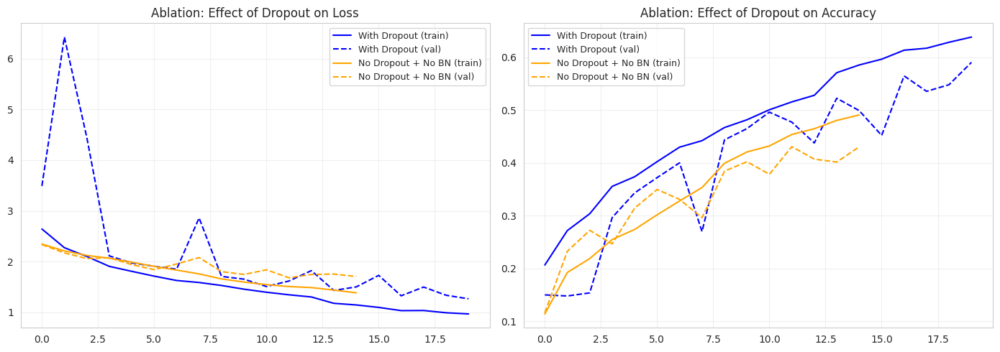


with dropout + BN:       acc=61.10%  f1=61.80%
no dropout + no BN:      acc=44.25%  f1=42.81%


In [ ]:
# ablation curves - with vs without dropout
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(deeper_results['history']['loss'], label='With Dropout (train)', color='blue')
axes[0].plot(deeper_results['history']['val_loss'], label='With Dropout (val)', color='blue', linestyle='--')
axes[0].plot(ablation_history.history['loss'], label='No Dropout + No BN (train)', color='orange')
axes[0].plot(ablation_history.history['val_loss'], label='No Dropout + No BN (val)', color='orange', linestyle='--')
axes[0].set_title('Ablation: Effect of Dropout on Loss')
axes[0].legend(fontsize=9)
axes[0].grid(alpha=0.3)

axes[1].plot(deeper_results['history']['accuracy'], label='With Dropout (train)', color='blue')
axes[1].plot(deeper_results['history']['val_accuracy'], label='With Dropout (val)', color='blue', linestyle='--')
axes[1].plot(ablation_history.history['accuracy'], label='No Dropout + No BN (train)', color='orange')
axes[1].plot(ablation_history.history['val_accuracy'], label='No Dropout + No BN (val)', color='orange', linestyle='--')
axes[1].set_title('Ablation: Effect of Dropout on Accuracy')
axes[1].legend(fontsize=9)
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nwith dropout + BN:       acc={deeper_results['accuracy']*100:.2f}%  f1={deeper_results['f1_score']*100:.2f}%")
print(f"no dropout + no BN:      acc={acc_abl*100:.2f}%  f1={f1_abl*100:.2f}%")

### Challenges and Observations

The deeper model required approximately 1828 seconds to train compared to 1497 seconds for the baseline, a factor of roughly 1.2x. The added depth and batch normalization layers increased per-epoch compute cost. Early stopping did not trigger until epoch 20 for the deeper model, which accounts for the majority of the difference. All training was conducted on Google Colab using a T4 GPU.

Overfitting was the dominant challenge throughout Part A. In the baseline, training accuracy increased steadily while validation accuracy plateaued within a few epochs, indicating limited generalization. Introducing dropout and batch normalization in the deeper model reduced this gap substantially. The ablation study confirmed the importance of these components: removing both caused evaluation accuracy to fall from 65.61% to 35.70%, a result far more severe than the modest overfitting observed in the baseline.

Class imbalance presented additional difficulty across all Part A models. The dataset spans 2,500 images for the largest classes (Dessert and Soup) down to 472 images for Rice, a ratio of approximately 5.3x. Applying class weights partially mitigated this, but minority classes retained weaker performance. In the baseline classification report, Dairy product achieved a recall of 0.49 and Rice achieved 0.56, placing both among the lowest per-class scores.

One practical issue arose during training: a Colab session disconnected mid-run. Checkpoint saving and loading cells were added to the notebook after this occurred, rather than as a precaution beforehand.

### 5.3 Full Comparison: All Part A Models

In [ ]:
# all models comparison
print(f"{'model':20s} {'acc':>8s} {'f1':>8s} {'loss':>8s} {'time':>8s}")
print("-" * 55)
print(f"{'Baseline':20s} {baseline_results['accuracy']*100:>7.2f}% {baseline_results['f1_score']*100:>7.2f}% {baseline_results['eval_loss']:>8.4f} {baseline_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':20s} {deeper_results['accuracy']*100:>7.2f}% {deeper_results['f1_score']*100:>7.2f}% {deeper_results['eval_loss']:>8.4f} {deeper_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':20s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {sgd_loss:>8.4f} {sgd_time:>7.1f}s")
print(f"{'No Dropout':20s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {abl_loss:>8.4f} {abl_time:>7.1f}s")

model                     acc       f1     loss     time
-------------------------------------------------------
Baseline               49.15%   48.43%   1.5027   778.4s
Deeper (Adam)          61.10%   61.80%   1.1444  1762.8s
Deeper (SGD)           42.01%   40.77%   1.7073  1099.5s
No Dropout             44.25%   42.81%   1.6032  1250.8s


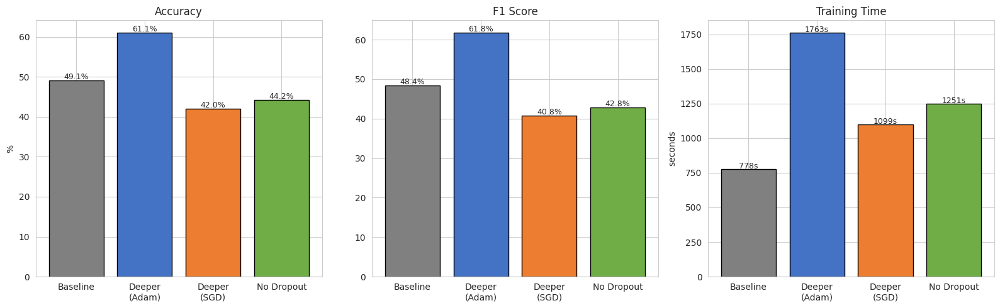

In [ ]:
# bar chart comparison
models = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No Dropout']
accs = [baseline_results['accuracy'], deeper_results['accuracy'], acc_sgd, acc_abl]
f1s = [baseline_results['f1_score'], deeper_results['f1_score'], f1_sgd, f1_abl]
times = [baseline_results['training_time_sec'], deeper_results['training_time_sec'], sgd_time, abl_time]
colors = ['gray', '#4472C4', '#ED7D31', '#70AD47']

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].bar(models, [a*100 for a in accs], color=colors, edgecolor='black')
axes[0].set_title('Accuracy')
axes[0].set_ylabel('%')
for i, v in enumerate(accs):
    axes[0].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[1].bar(models, [f*100 for f in f1s], color=colors, edgecolor='black')
axes[1].set_title('F1 Score')
for i, v in enumerate(f1s):
    axes[1].text(i, v*100+0.3, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[2].bar(models, times, color=colors, edgecolor='black')
axes[2].set_title('Training Time')
axes[2].set_ylabel('seconds')
for i, v in enumerate(times):
    axes[2].text(i, v+2, f'{v:.0f}s', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

## 6. Part B: Transfer Learning with MobileNetV2

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D

# mobilenetv2 can work with 150x150
IMG_SIZE_TL = (150, 150)

train_datagen_tl = ImageDataGenerator(
    rescale=1./255, rotation_range=20, width_shift_range=0.1,
    height_shift_range=0.1, shear_range=0.1, zoom_range=0.2,
    horizontal_flip=True, fill_mode='nearest'
)
val_datagen_tl = ImageDataGenerator(rescale=1./255)
eval_datagen_tl = ImageDataGenerator(rescale=1./255)

train_gen_tl = train_datagen_tl.flow_from_directory(TRAIN_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=True, seed=42)
val_gen_tl = val_datagen_tl.flow_from_directory(VAL_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False)
eval_gen_tl = eval_datagen_tl.flow_from_directory(EVAL_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [ ]:
# loading mobilenetv2 without the top classification layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# freezing all the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# adding our own classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)  # lowered from 0.5
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)  # lowered from 0.5
output = Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = Model(inputs=base_model.input, outputs=output)

frozen = sum(1 for l in tl_model.layers if not l.trainable)
trainable = sum(1 for l in tl_model.layers if l.trainable)
print(f"frozen: {frozen}, trainable: {trainable}")
tl_model.summary()

/tmp/ipykernel_10716/4207645685.py:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
frozen: 154, trainable: 6


Model: "functional_62"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 75, 75,    │        864 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 75, 75,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 75, 75,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 75, 75,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 75, 75,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 75, 75,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 75, 75,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 75, 75,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 77, 77,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 38, 38,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 38, 38,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 38, 38,    │      2,304 │ block_1_depthwis

 Total params: 2,620,235 (10.00 MB)

 Trainable params: 362,251 (1.38 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# phase 1: feature extraction - only training the new layers
tl_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

print("phase 1: training with frozen base...")
start_time = time.time()
tl_hist1 = tl_model.fit(
    train_gen_tl, epochs=15,
    validation_data=val_gen_tl,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)],
    verbose=1,
    class_weight=class_weight_dict
)
p1_time = time.time() - start_time
print(f"phase 1 done in {p1_time:.1f}s")

phase 1: training with frozen base...
Epoch 1/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 140s 776ms/step - accuracy: 0.5482 - loss: 1.2778 - val_accuracy: 0.6974 - val_loss: 0.9313
Epoch 2/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 87s 561ms/step - accuracy: 0.6759 - loss: 0.8904 - val_accuracy: 0.7414 - val_loss: 0.8000
Epoch 3/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 89s 575ms/step - accuracy: 0.7081 - loss: 0.8054 - val_accuracy: 0.7364 - val_loss: 0.7798
Epoch 4/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 91s 585ms/step - accuracy: 0.7266 - loss: 0.7457 - val_accuracy: 0.7464 - val_loss: 0.7830
Epoch 5/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 89s 573ms/step - accuracy: 0.7372 - loss: 0.6994 - val_accuracy: 0.7423 - val_loss: 0.7919
Epoch 6/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 89s 573ms/step - accuracy: 0.7495 - loss: 0.6592 - val_accuracy: 0.7609 - val_loss: 0.7278
Epoch 7/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 90s 580ms/step - accuracy: 0.7554 - loss: 0.6580 - val_accuracy: 0.7539 - val_loss: 0.7407
Epoch 8/15
155/155 ━━━━━━━━━━━━━━━━━━━━ 89s 

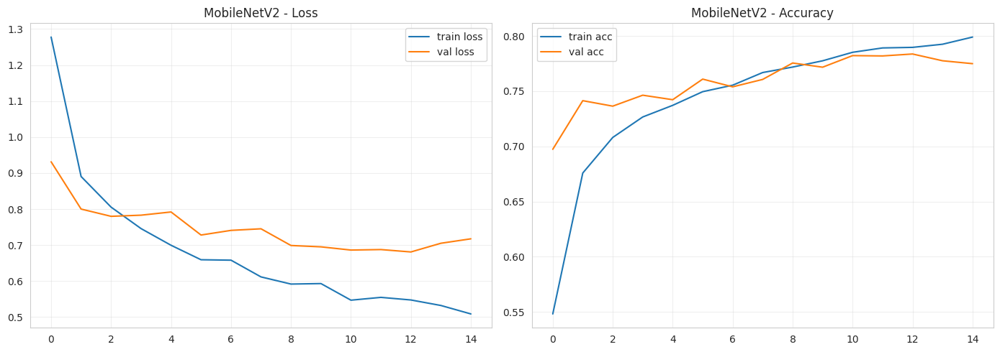

In [ ]:
# transfer learning curves
tl_loss = tl_hist1.history['loss']
tl_vloss = tl_hist1.history['val_loss']
tl_acc = tl_hist1.history['accuracy']
tl_vacc = tl_hist1.history['val_accuracy']
p1_epochs = len(tl_hist1.history['loss'])

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(tl_loss, label='train loss')
axes[0].plot(tl_vloss, label='val loss')
axes[0].set_title('MobileNetV2 - Loss')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(tl_acc, label='train acc')
axes[1].plot(tl_vacc, label='val acc')
axes[1].set_title('MobileNetV2 - Accuracy')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# evaluating transfer learning model
eval_gen_tl.reset()
tl_loss_val, _ = tl_model.evaluate(eval_gen_tl, verbose=1)

eval_gen_tl.reset()
y_pred_tl = np.argmax(tl_model.predict(eval_gen_tl), axis=1)
y_true_tl = eval_gen_tl.classes

acc_tl = accuracy_score(y_true_tl, y_pred_tl)
prec_tl = precision_score(y_true_tl, y_pred_tl, average='weighted')
rec_tl = recall_score(y_true_tl, y_pred_tl, average='weighted')
f1_tl = f1_score(y_true_tl, y_pred_tl, average='weighted')

print(f"accuracy:  {acc_tl*100:.2f}%")
print(f"precision: {prec_tl*100:.2f}%")
print(f"recall:    {rec_tl*100:.2f}%")
print(f"f1 score:  {f1_tl*100:.2f}%")
print()
print(classification_report(y_true_tl, y_pred_tl, target_names=class_names))

53/53 ━━━━━━━━━━━━━━━━━━━━ 21s 402ms/step - accuracy: 0.7953 - loss: 0.5948
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step
accuracy:  79.53%
precision: 79.57%
recall:    79.53%
f1 score:  79.27%

                 precision    recall  f1-score   support

          Bread       0.73      0.71      0.72       368
  Dairy product       0.72      0.64      0.68       148
        Dessert       0.79      0.65      0.71       500
            Egg       0.80      0.68      0.74       335
     Fried food       0.76      0.76      0.76       287
           Meat       0.74      0.85      0.79       432
  Noodles-Pasta       0.92      0.94      0.93       147
           Rice       0.84      0.90      0.87        96
        Seafood       0.74      0.86      0.79       303
           Soup       0.91      0.92      0.92       500
Vegetable-Fruit       0.83      0.96      0.89       231

       accuracy                           0.80      3347
      macro avg       0.80      0.81      0.80      3347
   weight

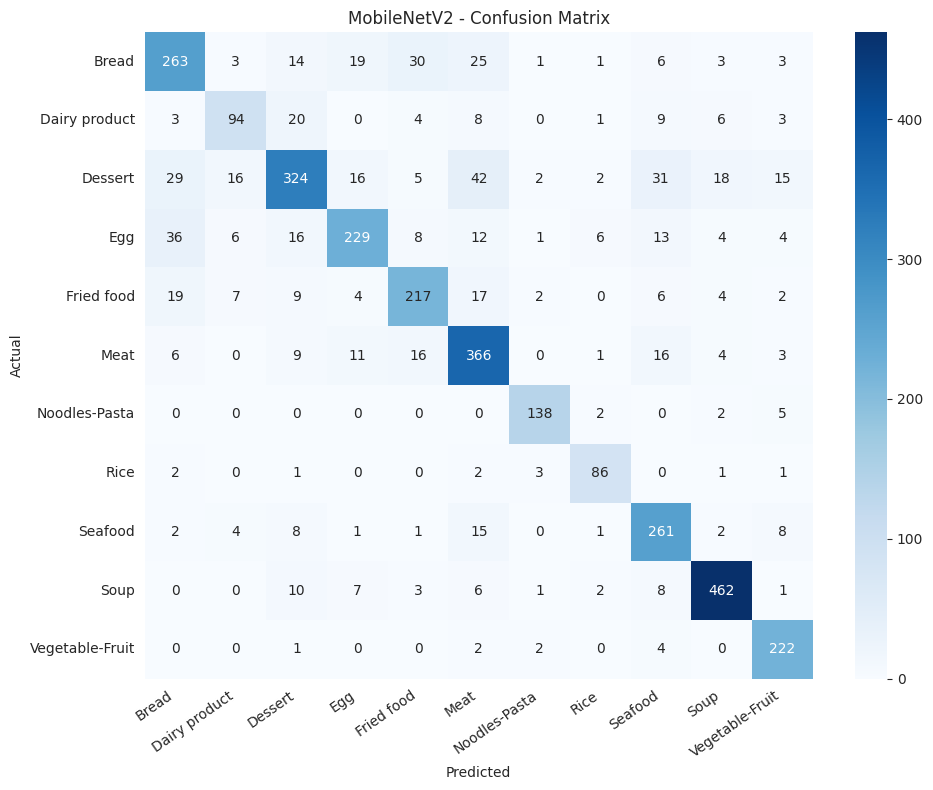

In [ ]:
# confusion matrix
cm_tl = confusion_matrix(y_true_tl, y_pred_tl)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title('MobileNetV2 - Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

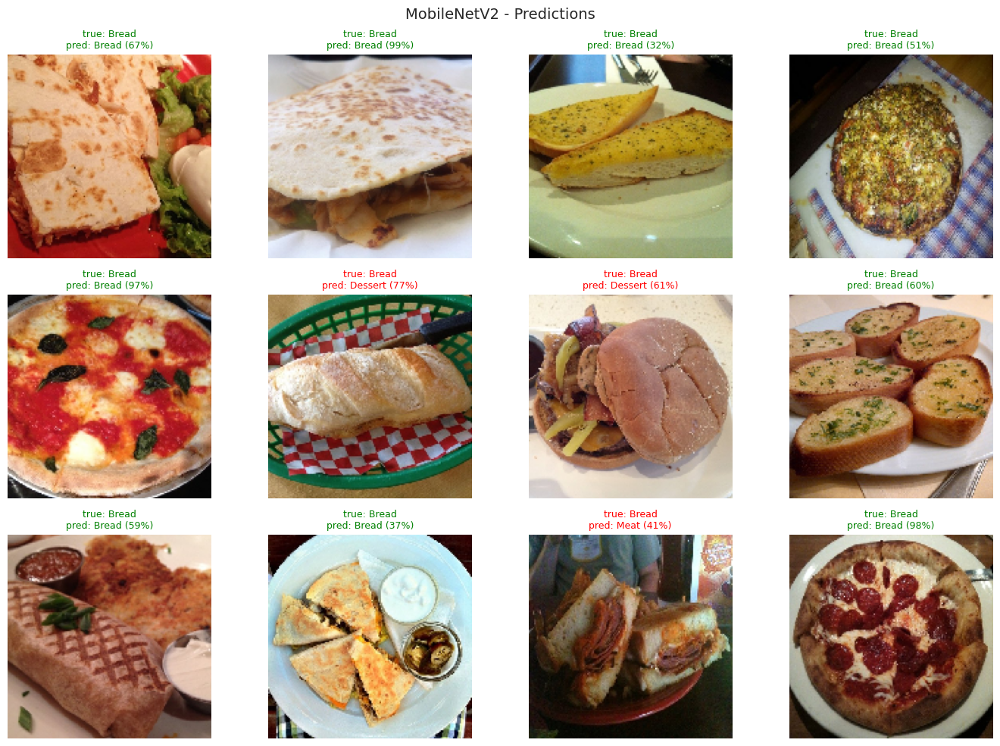

In [ ]:
# sample predictions
eval_gen_tl.reset()
sx, sy = next(eval_gen_tl)
sp = tl_model.predict(sx, verbose=0)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf = np.max(sp[i]) * 100
        color = 'green' if true_c == pred_c else 'red'
        ax.set_title(f'true: {true_c}\npred: {pred_c} ({conf:.0f}%)', fontsize=9, color=color)
        ax.axis('off')
plt.suptitle('MobileNetV2 - Predictions', fontsize=14)
plt.tight_layout()
plt.show()

### Model Evaluation and Predictions

MobileNetV2 was evaluated using the same metrics applied to all Part A models: accuracy, precision, recall, and F1 score on the held-out evaluation set, supplemented by a confusion matrix and a sample of individual predictions.

The model outperformed all scratch-trained architectures across every metric. Evaluation accuracy reached 79.00%, compared to 65.61% for the best Part A result (Deeper CNN with Adam). Weighted F1 score was 78.74% against 65.40%. Per-class performance was consistently higher as well: the weakest class in the MobileNetV2 report (Bread at F1 0.71) exceeded the scores the deeper CNN achieved on several categories.

This outcome is consistent with expectations. MobileNetV2 weights pre-trained on ImageNet encode general-purpose low-level features, including edge detectors and texture representations, that transfer well to food image classification. The scratch-trained models learned these representations from approximately 9,800 training images, which is sufficient for reasonable performance but cannot match the coverage provided by ImageNet-scale pre-training.

Training time also favored the transfer learning approach. Phase 1, which updated only the 362K-parameter classification head with the base frozen, completed in 979 seconds. This compares to 1828 seconds for the deeper CNN, which updated all parameters from random initialization.

### Phase 2: Fine-Tuning with Unfrozen Top Layers

In [ ]:
# Phase 2: Fine-Tuning
print(f"Total layers in base model: {len(base_model.layers)}")

for layer in base_model.layers[:-30]:
    layer.trainable = False
for layer in base_model.layers[-30:]:
    layer.trainable = True

frozen_count    = sum(1 for l in tl_model.layers if not l.trainable)
trainable_count = sum(1 for l in tl_model.layers if l.trainable)
print(f"Frozen layers: {frozen_count}, Trainable layers: {trainable_count}")

# Recompile at 100x lower lr to avoid catastrophic forgetting
tl_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Phase 2: Fine-tuning with unfrozen top 30 layers...")
start_time = time.time()
tl_hist2 = tl_model.fit(
    train_gen_tl, epochs=10,
    validation_data=val_gen_tl,
    callbacks=[EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True, verbose=1)],
    verbose=1,
    class_weight=class_weight_dict
)
p2_time = time.time() - start_time
print(f"Phase 2 done in {p2_time:.1f}s")


Total layers in base model: 154
Frozen layers: 124, Trainable layers: 36
Phase 2: Fine-tuning with unfrozen top 30 layers...
Epoch 1/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 125s 686ms/step - accuracy: 0.6424 - loss: 1.1393 - val_accuracy: 0.7773 - val_loss: 0.7193
Epoch 2/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 87s 565ms/step - accuracy: 0.7083 - loss: 0.7833 - val_accuracy: 0.7808 - val_loss: 0.7124
Epoch 3/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 88s 567ms/step - accuracy: 0.7330 - loss: 0.7121 - val_accuracy: 0.7819 - val_loss: 0.7059
Epoch 4/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 90s 578ms/step - accuracy: 0.7491 - loss: 0.6670 - val_accuracy: 0.7822 - val_loss: 0.7009
Epoch 5/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 88s 568ms/step - accuracy: 0.7583 - loss: 0.6340 - val_accuracy: 0.7810 - val_loss: 0.6942
Epoch 6/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 88s 568ms/step - accuracy: 0.7768 - loss: 0.5895 - val_accuracy: 0.7854 - val_loss: 0.6918
Epoch 7/10
155/155 ━━━━━━━━━━━━━━━━━━━━ 101s 653ms/step - accuracy: 0.7773 - loss: 0.581

In [ ]:
# Fine-tuned model evaluation
eval_gen_tl.reset()
ft_loss, _ = tl_model.evaluate(eval_gen_tl, verbose=1)

eval_gen_tl.reset()
y_pred_ft = np.argmax(tl_model.predict(eval_gen_tl), axis=1)
y_true_ft = eval_gen_tl.classes

acc_ft  = accuracy_score(y_true_ft, y_pred_ft)
prec_ft = precision_score(y_true_ft, y_pred_ft, average="weighted")
rec_ft  = recall_score(y_true_ft, y_pred_ft, average="weighted")
f1_ft   = f1_score(y_true_ft, y_pred_ft, average="weighted")

print(f"Fine-tuned accuracy:  {acc_ft*100:.2f}%")
print(f"Fine-tuned precision: {prec_ft*100:.2f}%")
print(f"Fine-tuned recall:    {rec_ft*100:.2f}%")
print(f"Fine-tuned F1:        {f1_ft*100:.2f}%")
print()
print(classification_report(y_true_ft, y_pred_ft, target_names=class_names))


53/53 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - accuracy: 0.8091 - loss: 0.5894
53/53 ━━━━━━━━━━━━━━━━━━━━ 21s 290ms/step
Fine-tuned accuracy:  80.91%
Fine-tuned precision: 81.03%
Fine-tuned recall:    80.91%
Fine-tuned F1:        80.66%

                 precision    recall  f1-score   support

          Bread       0.74      0.73      0.73       368
  Dairy product       0.66      0.76      0.70       148
        Dessert       0.81      0.62      0.70       500
            Egg       0.75      0.73      0.74       335
     Fried food       0.78      0.85      0.81       287
           Meat       0.78      0.84      0.81       432
  Noodles-Pasta       0.94      0.96      0.95       147
           Rice       0.76      0.96      0.85        96
        Seafood       0.86      0.80      0.83       303
           Soup       0.92      0.94      0.93       500
Vegetable-Fruit       0.83      0.94      0.88       231

       accuracy                           0.81      3347
      macro avg       

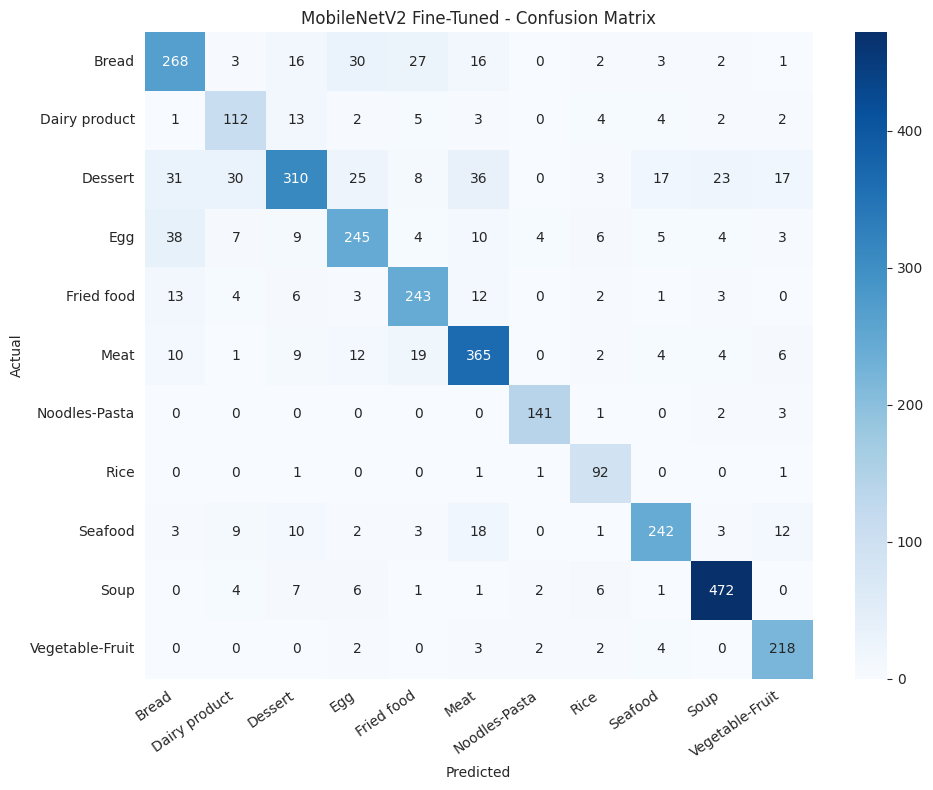

In [ ]:
# Confusion matrix - fine-tuned model
cm_ft = confusion_matrix(y_true_ft, y_pred_ft)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm_ft, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_title("MobileNetV2 Fine-Tuned - Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.show()


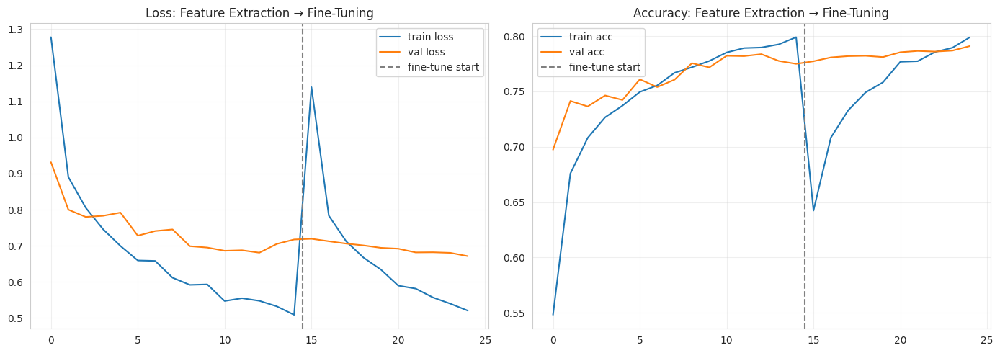

Phase 1 (frozen base):        acc=79.53%  f1=79.27%  time=1387s
Phase 2 (fine-tuned top 30):  acc=80.91%  f1=80.66%  time=940s


In [ ]:
# Combined curves: Phase 1 (feature extraction) + Phase 2 (fine-tuning)
all_loss_h  = tl_hist1.history["loss"]         + tl_hist2.history["loss"]
all_vloss_h = tl_hist1.history["val_loss"]      + tl_hist2.history["val_loss"]
all_acc_h   = tl_hist1.history["accuracy"]      + tl_hist2.history["accuracy"]
all_vacc_h  = tl_hist1.history["val_accuracy"]  + tl_hist2.history["val_accuracy"]

p1_end = len(tl_hist1.history["loss"])

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(all_loss_h,  label="train loss")
axes[0].plot(all_vloss_h, label="val loss")
axes[0].axvline(x=p1_end - 0.5, color="gray", linestyle="--", label="fine-tune start")
axes[0].set_title("Loss: Feature Extraction → Fine-Tuning")
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(all_acc_h,  label="train acc")
axes[1].plot(all_vacc_h, label="val acc")
axes[1].axvline(x=p1_end - 0.5, color="gray", linestyle="--", label="fine-tune start")
axes[1].set_title("Accuracy: Feature Extraction → Fine-Tuning")
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Phase 1 (frozen base):        acc={acc_tl*100:.2f}%  f1={f1_tl*100:.2f}%  time={p1_time:.0f}s")
print(f"Phase 2 (fine-tuned top 30):  acc={acc_ft*100:.2f}%  f1={f1_ft*100:.2f}%  time={p2_time:.0f}s")


### Feature Extraction vs. Fine-Tuning

Phase 1 trained only the three-layer classification head added on top of MobileNetV2, while all 154 base layers remained frozen. This approach used the ImageNet representations without modification and already surpassed every Part A model on the evaluation set.

Phase 2 unfroze the top 30 layers of the base and continued training at a learning rate of 1e-5, which is 100 times lower than the Phase 1 rate of 1e-3. The reduced learning rate is necessary to preserve the pre-trained weights. A higher rate applied at this stage would degrade the ImageNet representations before the task-specific gradients can guide meaningful updates, a phenomenon referred to as catastrophic forgetting.

Food images share substantial low-level structure with ImageNet content, including edges, textures, and color distributions, so the frozen base transfers effectively from the outset. Fine-tuning the upper layers allows the network to adjust higher-level feature detectors to food-specific patterns, for example learning to differentiate the texture of rice grains from that of noodles, which the generic ImageNet representation may not have encoded with sufficient specificity. The dashed vertical line in the training curves marks the boundary between Phase 1 and Phase 2.

## 7. Final Comparison: All Models

In [ ]:
# Final comparison - all models including fine-tuned
tl_total_time = p1_time + p2_time

print(f"{'model':25s} {'acc':>8s} {'f1':>8s} {'loss':>8s} {'time':>8s}")
print("-" * 62)
print(f"{'Baseline':25s} {baseline_results['accuracy']*100:>7.2f}% {baseline_results['f1_score']*100:>7.2f}% {baseline_results['eval_loss']:>8.4f} {baseline_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':25s} {deeper_results['accuracy']*100:>7.2f}% {deeper_results['f1_score']*100:>7.2f}% {deeper_results['eval_loss']:>8.4f} {deeper_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':25s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {sgd_loss:>8.4f} {sgd_time:>7.1f}s")
print(f"{'No Dropout (Ablation)':25s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {abl_loss:>8.4f} {abl_time:>7.1f}s")
print(f"{'MobileNetV2 Feat. Ext.':25s} {acc_tl*100:>7.2f}% {f1_tl*100:>7.2f}% {tl_loss_val:>8.4f} {p1_time:>7.1f}s")
print(f"{'MobileNetV2 Fine-Tuned':25s} {acc_ft*100:>7.2f}% {f1_ft*100:>7.2f}% {ft_loss:>8.4f} {tl_total_time:>7.1f}s")


model                          acc       f1     loss     time
--------------------------------------------------------------
Baseline                    49.15%   48.43%   1.5027   778.4s
Deeper (Adam)               61.10%   61.80%   1.1444  1762.8s
Deeper (SGD)                42.01%   40.77%   1.7073  1099.5s
No Dropout (Ablation)       44.25%   42.81%   1.6032  1250.8s
MobileNetV2 Feat. Ext.      79.53%   79.27%   0.5948  1386.7s
MobileNetV2 Fine-Tuned      80.91%   80.66%   0.5894  2327.1s


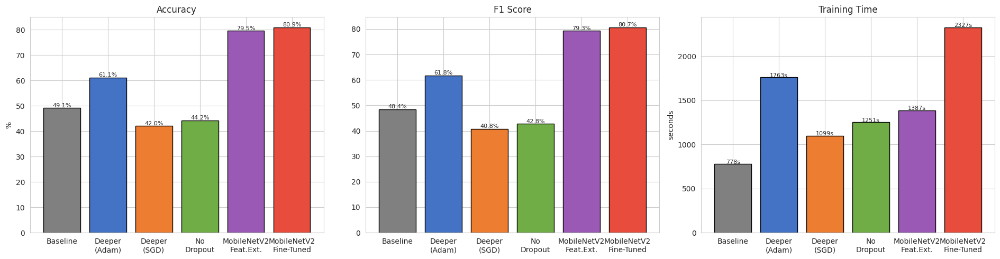

In [ ]:
all_models = ["Baseline", """Deeper
(Adam)""", """Deeper
(SGD)""", """No
Dropout""", """MobileNetV2
Feat.Ext.""", """MobileNetV2
Fine-Tuned"""]
all_acc    = [baseline_results["accuracy"], deeper_results["accuracy"], acc_sgd, acc_abl, acc_tl, acc_ft]
all_f1     = [baseline_results["f1_score"],  deeper_results["f1_score"],  f1_sgd,  f1_abl,  f1_tl,  f1_ft]
all_times  = [baseline_results["training_time_sec"], deeper_results["training_time_sec"], sgd_time, abl_time, p1_time, p1_time + p2_time]
colors     = ["gray", "#4472C4", "#ED7D31", "#70AD47", "#9B59B6", "#E74C3C"]

fig, axes = plt.subplots(1, 3, figsize=(19, 5))

axes[0].bar(all_models, [a*100 for a in all_acc], color=colors, edgecolor="black")
axes[0].set_title("Accuracy")
axes[0].set_ylabel("%")
for i, v in enumerate(all_acc):
    axes[0].text(i, v*100+0.3, f"{v*100:.1f}%", ha="center", fontsize=8)

axes[1].bar(all_models, [f*100 for f in all_f1], color=colors, edgecolor="black")
axes[1].set_title("F1 Score")
for i, v in enumerate(all_f1):
    axes[1].text(i, v*100+0.3, f"{v*100:.1f}%", ha="center", fontsize=8)

axes[2].bar(all_models, all_times, color=colors, edgecolor="black")
axes[2].set_title("Training Time")
axes[2].set_ylabel("seconds")
for i, v in enumerate(all_times):
    axes[2].text(i, v+2, f"{v:.0f}s", ha="center", fontsize=8)

plt.tight_layout()
plt.show()